In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report,confusion_matrix
import re
import string

## Importing Dataset

In [2]:
#Data represents content(i.e. the body text of articles) and HL represents the headline
fakeData = pd.read_csv("./Dataset/DataSet_Misinfo_FAKE.csv")
trueData = pd.read_csv("./Dataset/DataSet_Misinfo_TRUE.csv")
fakeHL = pd.read_csv("./Dataset/Fake_Headline.csv")
trueHL = pd.read_csv("./Dataset/True_Headline.csv")

In [3]:
fakeData.head()

,Unnamed: 0,text
0,0,Donald Trump just couldn t wish all Americans ...
1,1,House Intelligence Committee Chairman Devin Nu...
2,2,"On Friday, it was revealed that former Milwauk..."
3,3,"On Christmas day, Donald Trump announced that ..."
4,4,Pope Francis used his annual Christmas Day mes...


In [4]:
trueData.head()

,Unnamed: 0,text
0,0,The head of a conservative Republican faction ...
1,1,Transgender people will be allowed for the fir...
2,2,The special counsel investigation of links bet...
3,3,Trump campaign adviser George Papadopoulos tol...
4,4,President Donald Trump called on the U.S. Post...


In [5]:
fakeHL.head()

,title
0,Donald Trump Sends Out Embarrassing New Year’...
1,Drunk Bragging Trump Staffer Started Russian ...
2,Sheriff David Clarke Becomes An Internet Joke...
3,Trump Is So Obsessed He Even Has Obama’s Name...
4,Pope Francis Just Called Out Donald Trump Dur...


In [6]:
trueHL.head()

,title
0,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...


In [7]:
#Dropping first column of both content dataset as they are unrelated
fakeData = fakeData.drop(fakeData.columns[0], axis=1)
trueData = trueData.drop(trueData.columns[0], axis=1)

In [8]:
fakeData.head()

,text
0,Donald Trump just couldn t wish all Americans ...
1,House Intelligence Committee Chairman Devin Nu...
2,"On Friday, it was revealed that former Milwauk..."
3,"On Christmas day, Donald Trump announced that ..."
4,Pope Francis used his annual Christmas Day mes...


In [9]:
trueData.head()

,text
0,The head of a conservative Republican faction ...
1,Transgender people will be allowed for the fir...
2,The special counsel investigation of links bet...
3,Trump campaign adviser George Papadopoulos tol...
4,President Donald Trump called on the U.S. Post...


In [10]:
#Checking for size of each dataset
fakeData.shape, trueData.shape, fakeHL.shape, trueHL.shape

((43642, 1), (34975, 1), (23502, 1), (21417, 1))

In [11]:
##Checking for null values
print("fakeData null values: ",fakeData.isnull().sum())
print("trueData null values: ",trueData.isnull().sum())
print("fakeHL null values: ",trueHL.isnull().sum())   
print("trueHL null values: ",fakeHL.isnull().sum())   

fakeData null values:  text    0
dtype: int64
trueData null values:  text    29
dtype: int64
fakeHL null values:  title    0
dtype: int64
trueHL null values:  title    0
dtype: int64


In [12]:
#Removing Null values
trueData = trueData.dropna()

In [13]:
print("fakeData null values: ",fakeData.isnull().sum())
print("trueData null values: ",trueData.isnull().sum())
print("fakeHL null values: ",fakeHL.isnull().sum())  
print("trueHL null values: ",trueHL.isnull().sum())  

fakeData null values:  text    0
dtype: int64
trueData null values:  text    0
dtype: int64
fakeHL null values:  title    0
dtype: int64
trueHL null values:  title    0
dtype: int64


## Inserting 'label' column for model testing later

In [14]:
fakeData["label"] = 0
fakeHL["label"] = 0
trueData["label"] = 1
trueHL["label"] = 1

In [15]:
#Merging the two text dataset together
mergedData = pd.concat([fakeData, trueData], axis =0 )
mergedData = mergedData.sample(frac = 1) #This is to shuffle the dataset so that we know that data is merged correctly
mergedData.reset_index(inplace = True) #Resetting index for better presentation
mergedData.drop(["index"], axis = 1, inplace = True)
mergedData.head(20)

,text,label
0,"On Thursday, the National Association of Medic...",0
1,U.S. Attorney General Loretta Lynch said on Tu...,1
2,Tow the party line or pay a heavy price. There...,0
3,"Boy, wasn t Wednesday an embarrassing day for ...",0
4,Russia s defense ministry said on Thursday lon...,1
5,"Hillary s lawless, anti-American supporters we...",0
6,Emails released by the Oklahoma attorney gener...,1
7,Presidential candidate Hillary Clinton will me...,1
8,Canadian Prime Minister Justin Trudeau hopped ...,1
9,The probability that Britain exits the Europea...,1


In [16]:
#Merging the two headline dataset together
mergedHL = pd.concat([fakeHL, trueHL], axis =0 )
mergedHL = mergedHL.sample(frac = 1) #This is to shuffle the dataset so that we know that data is merged correctly
mergedHL.reset_index(inplace = True) #Resetting index for better presentation
mergedHL.drop(["index"], axis = 1, inplace = True)
mergedHL.head(20)

,title,label
0,Philippines president says China agrees to wor...,1
1,Iraq Kurds seek international help to lift san...,1
2,NASTY WOMEN! Ivanka Trump BOOED…HISSED By Unbe...,0
3,SHOULD PRESCHOOL KIDS Learn About Same-Sex Mar...,0
4,Lebanese president presses Saudi to say why Ha...,1
5,House Republicans move to shut down Democratic...,1
6,Gere faults Trump for blurring meaning of 'ref...,1
7,Alabama governor to face impeachment push in s...,1
8,Deadly Somalia blast reveals flaws in intellig...,1
9,France's Macron says world is losing battle ag...,1


## Initial Data Exploration

Text(0.5, 1.0, 'target variable count')

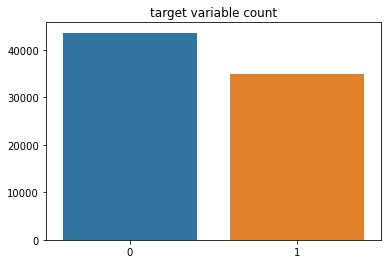

In [17]:
#Checking for imbalance in the news body dataset
count = mergedData['label'].value_counts().values
sns.barplot(x = [0, 1], y = count)
plt.title('target variable count')

Text(0.5, 1.0, 'target variable count')

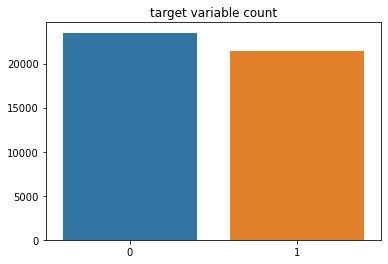

In [18]:
#Checking for imbalance in the HL dataset
count = mergedHL['label'].value_counts().values
sns.barplot(x = [0, 1], y = count)
plt.title('target variable count')

Both Dataset are not imbalanced

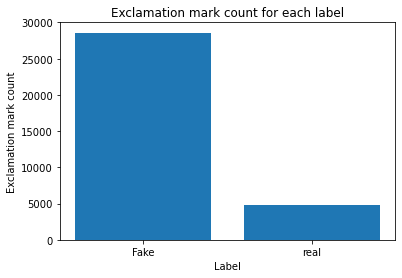

In [19]:
#Counting number of '!' for body text
counts = mergedData.groupby('label')['text'].apply(lambda x: x.str.count('!').sum()).reset_index()

# Plot the barplot
labels = ['Fake', 'real']
plt.bar(labels, counts['text'])
plt.xlabel('Label')
plt.ylabel('Exclamation mark count')
plt.title('Exclamation mark count for each label')
plt.show()

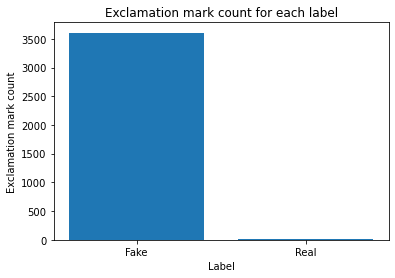

In [20]:
#Counting number of '!' for Headlines
counts = mergedHL.groupby('label')['title'].apply(lambda x: x.str.count('!').sum()).reset_index()

# Plot the barplot
labels = ['Fake', 'Real']
plt.bar(labels, counts['title'])
plt.xlabel('Label')
plt.ylabel('Exclamation mark count')
plt.title('Exclamation mark count for each label')
plt.show()

It seems that fake news tend to use more '!' as compared to real news. This is true for both news headline and news body text.

### Checking number of characters in each article

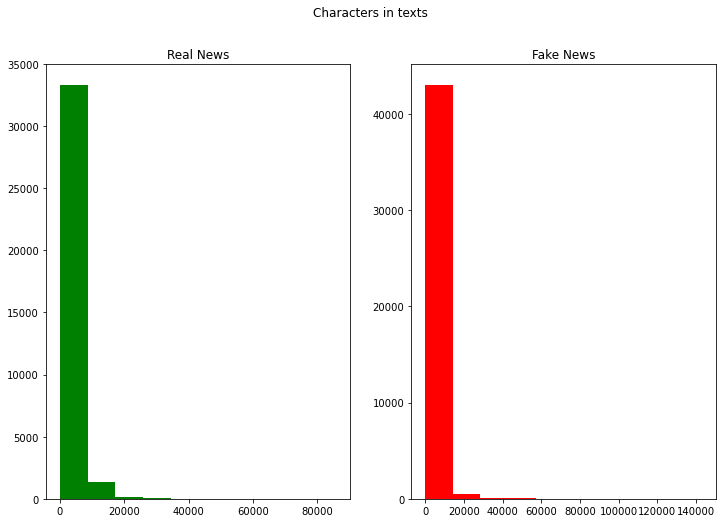

In [21]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=mergedData[mergedData['label']==1]['text'].str.len()
ax1.hist(text_len,color='green')
ax1.set_title('Real News')
text_len=mergedData[mergedData['label']==0]['text'].str.len()
ax2.hist(text_len,color='red')
ax2.set_title('Fake News')
fig.suptitle('Characters in texts')
plt.show()

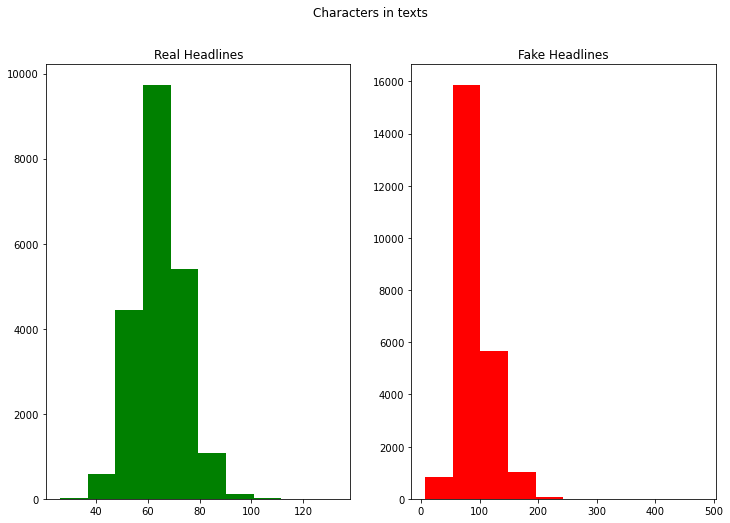

In [22]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=mergedHL[mergedHL['label']==1]['title'].str.len()
ax1.hist(text_len,color='green')
ax1.set_title('Real Headlines')
text_len=mergedHL[mergedHL['label']==0]['title'].str.len()
ax2.hist(text_len,color='red')
ax2.set_title('Fake Headlines')
fig.suptitle('Characters in texts')
plt.show()

### Checking number of words in each article

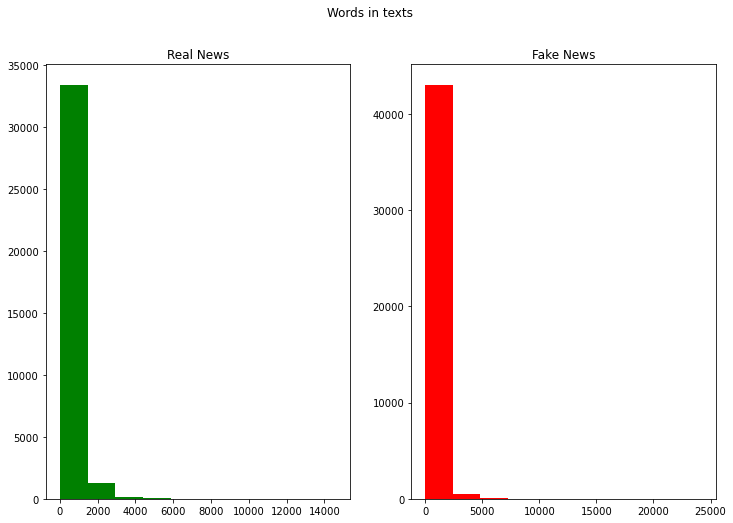

In [23]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=mergedData[mergedData['label']==1]['text'].str.split().map(lambda x: len(x))
ax1.hist(text_len,color='green')
ax1.set_title('Real News')
text_len=mergedData[mergedData['label']==0]['text'].str.split().map(lambda x: len(x))
ax2.hist(text_len,color='red')
ax2.set_title('Fake News')
fig.suptitle('Words in texts')
plt.show()

In [24]:
# Calculate mean number of words for real news body
real_text_len=mergedData[mergedData['label']==1]['text'].str.split().map(lambda x: len(x))
real_mean_words = real_text_len.mean()
print("Mean number of words in real body:", real_mean_words)

# Calculate mean number of words for fake news body
fake_text_len=mergedData[mergedData['label']==0]['text'].str.split().map(lambda x: len(x))
fake_mean_words = fake_text_len.mean()
print("Mean number of words in fake body:", fake_mean_words)

Mean number of words in real body: 533.5851027299261
Mean number of words in fake body: 436.3785115255946


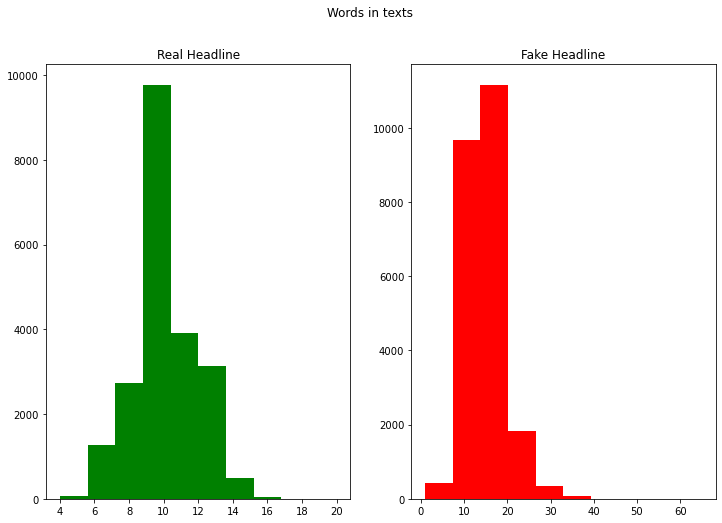

In [25]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(12,8))
text_len=mergedHL[mergedHL['label']==1]['title'].str.split().map(lambda x: len(x))
ax1.hist(text_len,color='green')
ax1.set_title('Real Headline')
text_len=mergedHL[mergedHL['label']==0]['title'].str.split().map(lambda x: len(x))
ax2.hist(text_len,color='red')
ax2.set_title('Fake Headline')
fig.suptitle('Words in texts')
plt.show()

In [26]:
# Calculate mean number of words for real headlines
real_text_len = mergedHL[mergedHL['label']==1]['title'].str.split().map(lambda x: len(x))
real_mean_words = real_text_len.mean()
print("Mean number of words in real headlines:", real_mean_words)

# Calculate mean number of words for fake headlines
fake_text_len = mergedHL[mergedHL['label']==0]['title'].str.split().map(lambda x: len(x))
fake_mean_words = fake_text_len.mean()
print("Mean number of words in fake headlines:", fake_mean_words)

Mean number of words in real headlines: 9.954475416725032
Mean number of words in fake headlines: 14.737213854140073


C:\Users\qiron\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\qiron\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0.98, 'Average word length in each text')

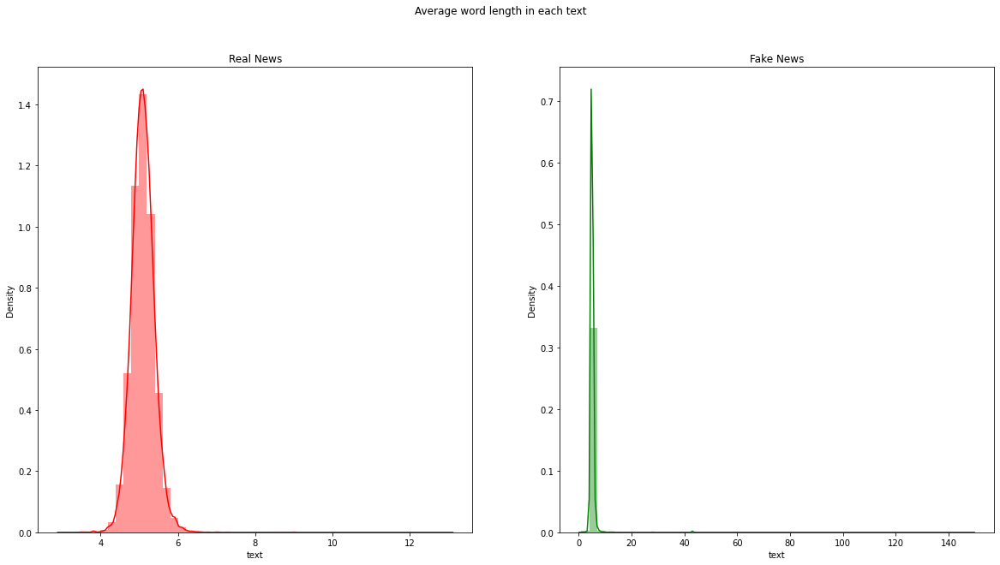

In [27]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
word=mergedData[mergedData['label']==1]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='red')
ax1.set_title('Real News')
word=mergedData[mergedData['label']==0]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='green')
ax2.set_title('Fake News')
fig.suptitle('Average word length in each text')

C:\Users\qiron\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\qiron\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 0.98, 'Average word length in each text')

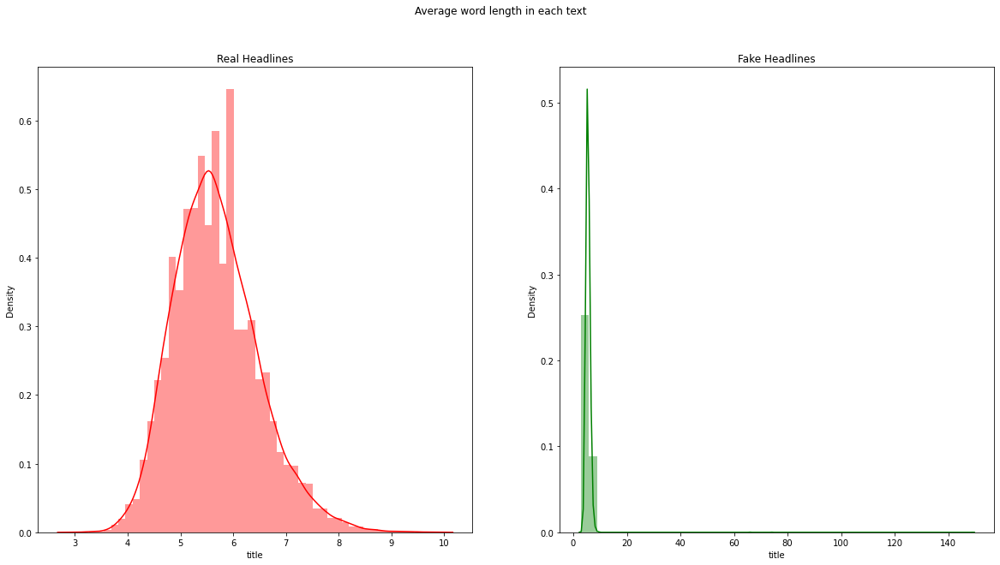

In [28]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(20,10))
word=mergedHL[mergedHL['label']==1]['title'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='red')
ax1.set_title('Real Headlines')
word=mergedHL[mergedHL['label']==0]['title'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='green')
ax2.set_title('Fake Headlines')
fig.suptitle('Average word length in each text')

## Text Preprocessing

##### WHAT ARE STOPWORDS?

Stopwords are the English words which does not add much meaning to a sentence. They can safely be ignored without sacrificing the meaning of the sentence. For example, the words like the, he, have etc.

In [29]:
#import wordcloud
#import sys
#!{sys.executable} -m pip install wordcloud 
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
stop = set(stopwords.words('english'))
punctuation = list(string.punctuation)
stop.update(punctuation)

In [30]:
#Removing the stopwords from text
def remove_stopwords(text):
    final_text = []
    for i in text.split():
        if i.strip().lower() not in stop:
            final_text.append(i.strip())
    return " ".join(final_text)

def processWords(text):
    text = re.sub(r'http\S+', '', text.lower()) #Lowercase all words & remove their URL
    text = re.sub('<.*?>+', '', text) #Remove <HTML> tags as a result of web scraping bugs
    text = re.sub('[%s]' % re.escape(string.punctuation.replace('!', '')), '', text) #Remove all punctuations except ! and special characters
    text = re.sub('\n', '', text) #Removes all newline characters
    text = re.sub('\[.*?\]', '', text) #Remove any words contained in a []
    text = re.sub('\w*\d\w*', '', text) #removes all alphanumeric substrings that contain at least one digit from the input string.
    text = re.sub("\\W"," ",text) #Replace all non-alphanumeric characters with space
    text = remove_stopwords(text)
    return text

In [31]:
mergedData["text"] = mergedData["text"].apply(processWords)
mergedHL["title"] = mergedHL["title"].apply(processWords)

### Lemmatization
Lemmatization considers the context and converts the word to its meaningful base form (e.g. jumping -> jump)

In [32]:
import nltk 
#nltk.download('averaged_perceptron_tagger')
#nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
lemmatizer = WordNetLemmatizer()

# Convert the nltk pos tags to tags that wordnet can recognize
def nltkToWordnet(nltk_tag):
  if nltk_tag.startswith('J'):
    return wordnet.ADJ
  elif nltk_tag.startswith('V'):
    return wordnet.VERB
  elif nltk_tag.startswith('N'):
    return wordnet.NOUN
  elif nltk_tag.startswith('R'):
    return wordnet.ADV
  else:                    
    return None

# Lemmatize a list of words/tokens
def lemmatize(text):
    tokens = text.split()
    pos_tags = nltk.pos_tag(tokens)    
    res_words = []
    for word, tag in pos_tags:
        tag = nltkToWordnet(tag)    
        if tag is None:                        
            res_words.append(word)
        else:
            res_words.append(lemmatizer.lemmatize(word, tag))
    return ''.join([word + ' ' for word in res_words]) #Return as full text instead of list of words

In [33]:
mergedData['text'] = mergedData['text'].apply(lemmatize) #Split the sentences into a list of words first then lemmatize them
mergedData['text'].head()

0    thursday national association medicaid directo...
1    us attorney general loretta lynch say tuesday ...
2    tow party line pay heavy price room dissention...
3    boy wednesday embarrassing day donald trump lo...
4    russia defense ministry say thursday longrange...
Name: text, dtype: object

In [34]:
mergedHL['title'] = mergedHL['title'].apply(lemmatize) #Split the sentences into a list of words first then lemmatize them
mergedHL['title'].head()

0    philippine president say china agree work sout...
1    iraq kurd seek international help lift sanctio...
2    nasty woman ivanka trump booed hiss unbelievab...
3    preschool kid learn samesex marriage antibias ...
4    lebanese president press saudi say hariri return 
Name: title, dtype: object

## Exploratory Data Analysis

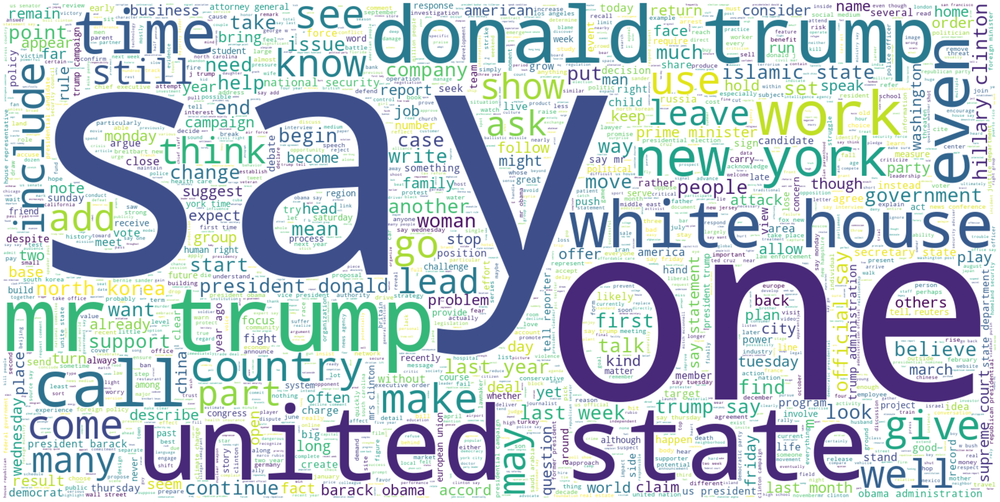

In [35]:
#Word cloud for real body news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(mergedData[mergedData['label'] == 1].text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

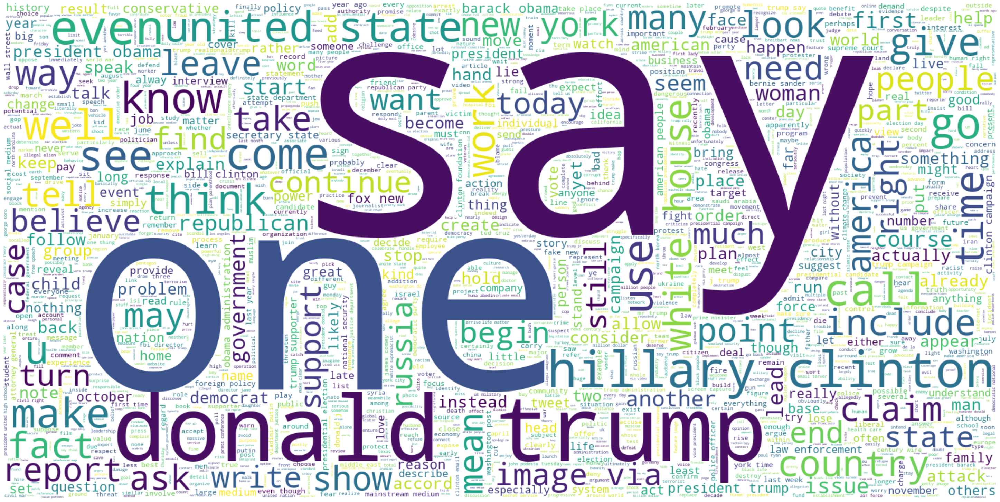

In [36]:
#Word cloud for fake body news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(mergedData[mergedData['label'] == 0].text))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

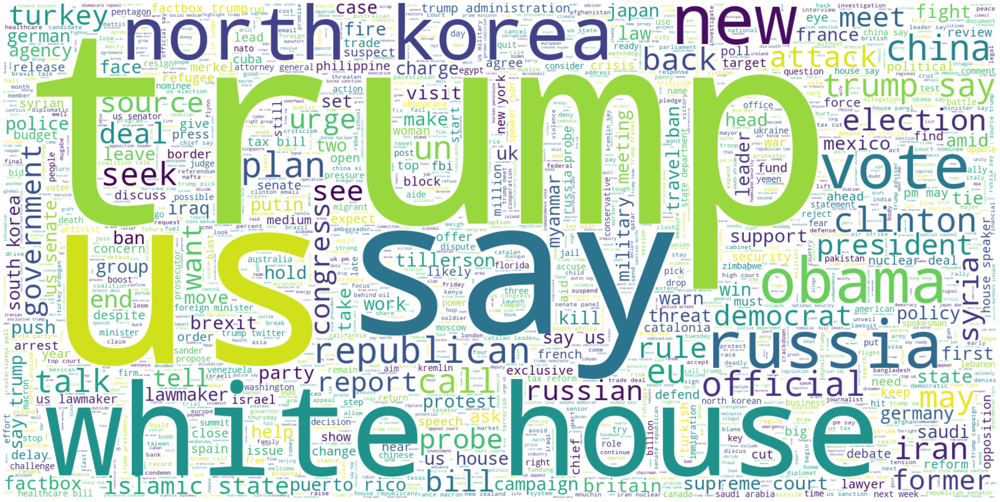

In [37]:
#Word cloud for real headline news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(mergedHL[mergedHL['label'] == 1].title))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

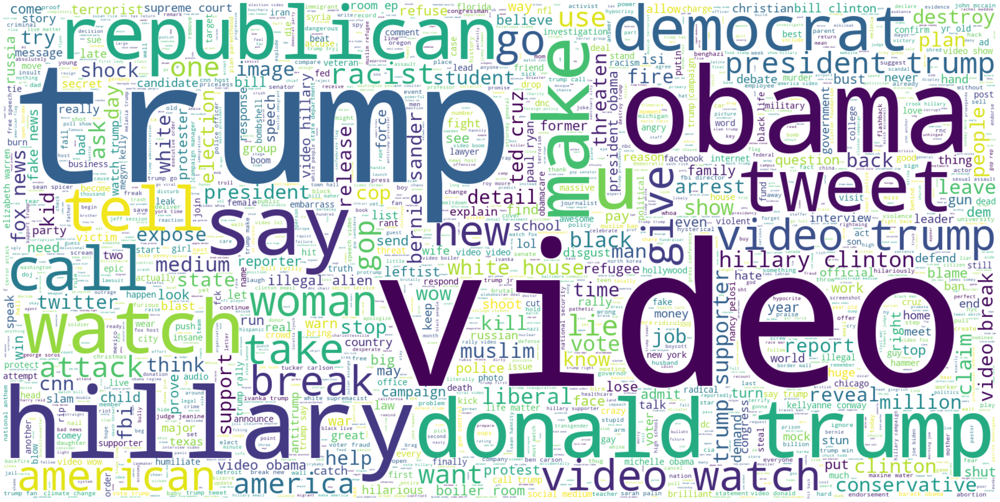

In [38]:
#Word cloud for fake Headline news
cloud = WordCloud(max_words = 1800, 
                  width = 1600, 
                  height = 800,
                  stopwords = STOPWORDS, 
                  background_color = "white").generate(" ".join(mergedHL[mergedHL['label'] == 0].title))
plt.figure(figsize=(40, 30))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

We can see that alot of the articles were during the infamous 2016 election campaign where fake news ran rampant. From the word cloud, we can see that in the fake news articles, there was alot of mention about hillary clinton as compared to the real news articles. This is true even for the fake headlines. Words that may be unrelated to the election campaign such as Russia also pops out.

### Analysing common words in the dataset

In [39]:
def get_corpus(text):
    words = []
    for i in text:
        for j in i.split():
            words.append(j.strip())
    return words
fake_body_words = get_corpus(mergedData.loc[mergedData['label'] == 0, 'text'])
real_body_words = get_corpus(mergedData.loc[mergedData['label'] == 1, 'text'])
fake_headline_words = get_corpus(mergedHL.loc[mergedHL['label'] == 0, 'title'])
real_headline_words = get_corpus(mergedHL.loc[mergedHL['label'] == 1, 'title'])

In [40]:
print(fake_body_words[:5])
print(real_body_words[:5])
print(fake_headline_words[:5])
print(real_headline_words[:5])

['thursday', 'national', 'association', 'medicaid', 'director']
['us', 'attorney', 'general', 'loretta', 'lynch']
['nasty', 'woman', 'ivanka', 'trump', 'booed']
['philippine', 'president', 'say', 'china', 'agree']


In [41]:
from collections import Counter
counter = Counter(fake_body_words)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'trump': 99980,
 'say': 79131,
 'us': 51106,
 'people': 49166,
 'state': 46020,
 'one': 45615,
 'clinton': 45331,
 'would': 43216,
 'go': 40776,
 'make': 40380}

In [42]:
counter = Counter(fake_headline_words)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'trump': 8903,
 'video': 8439,
 'obama': 2545,
 'hillary': 2275,
 'watch': 1977,
 'get': 1333,
 'clinton': 1157,
 'president': 1136,
 'us': 1106,
 'say': 1095}

In [43]:
counter = Counter(real_body_words)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'say': 198533,
 'trump': 95426,
 'mr': 67443,
 'state': 63680,
 'would': 56668,
 'president': 46934,
 'us': 46804,
 'year': 41665,
 'one': 40091,
 'new': 38897}

In [44]:
counter = Counter(real_headline_words)
most_common = counter.most_common(10)
most_common = dict(most_common)
most_common

{'trump': 5324,
 'us': 4028,
 'say': 3244,
 'house': 1446,
 'north': 925,
 'russia': 890,
 'new': 876,
 'korea': 874,
 'republican': 861,
 'white': 815}

In [45]:
from sklearn.feature_extraction.text import CountVectorizer
def get_top_text_ngrams(corpus, n, g):
    vec = CountVectorizer(ngram_range=(g, g)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

### Unigram Analysis

<AxesSubplot:>

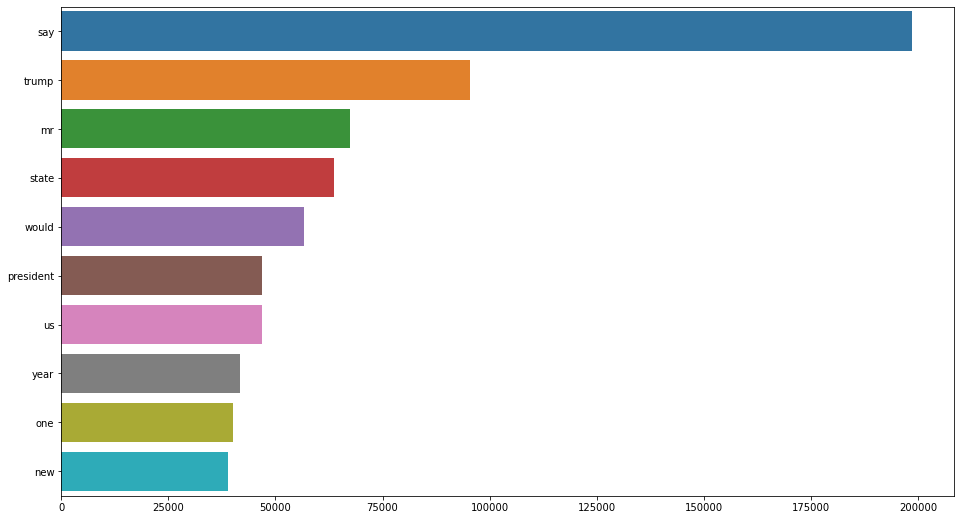

In [46]:
#Real body text
plt.figure(figsize = (16,9))
most_common_uni = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 1, 'text'],10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))

<AxesSubplot:>

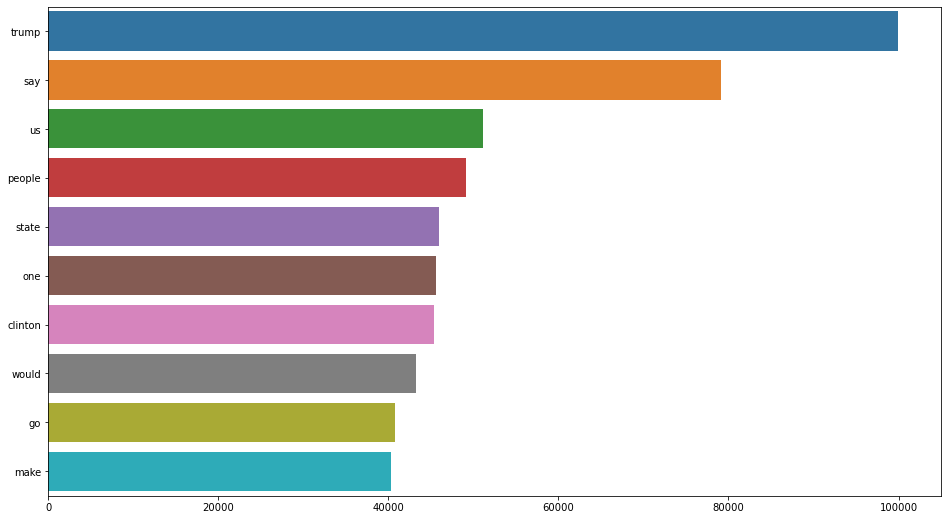

In [47]:
#Fake body text
plt.figure(figsize = (16,9))
most_common_uni = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 0, 'text'],10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))

<AxesSubplot:>

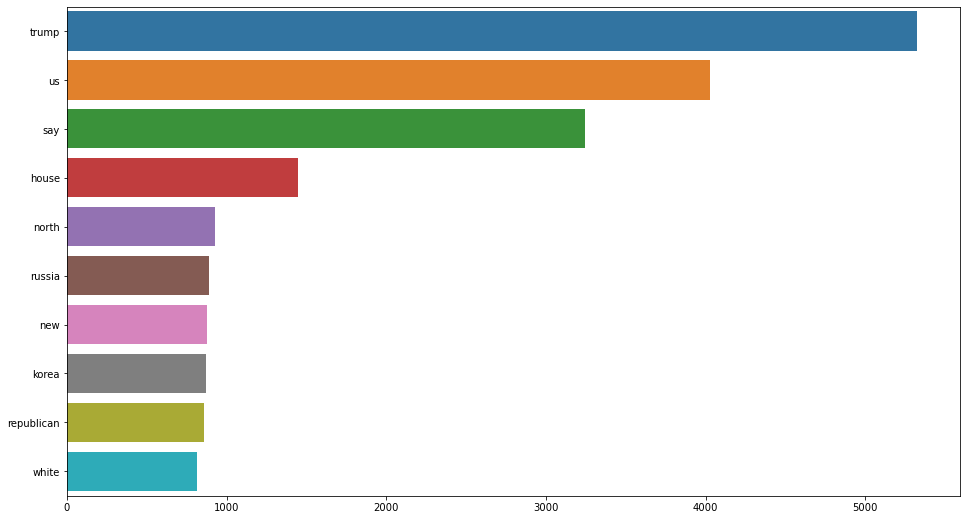

In [48]:
#Real headline text
plt.figure(figsize = (16,9))
most_common_uni = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 1, 'title'],10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))

<AxesSubplot:>

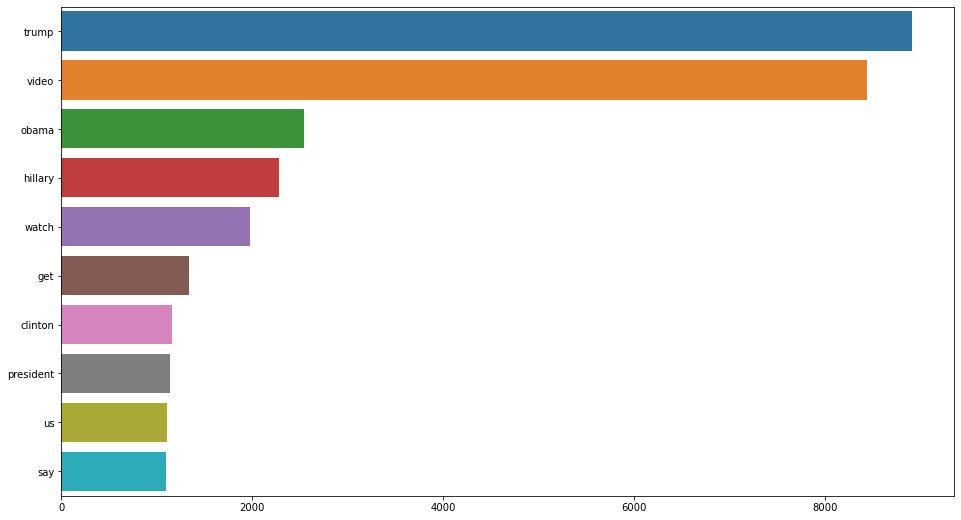

In [49]:
#Fake headline text
plt.figure(figsize = (16,9))
most_common_uni = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 0, 'title'],10,1)
most_common_uni = dict(most_common_uni)
sns.barplot(x=list(most_common_uni.values()),y=list(most_common_uni.keys()))

### Bigram Analysis

<AxesSubplot:>

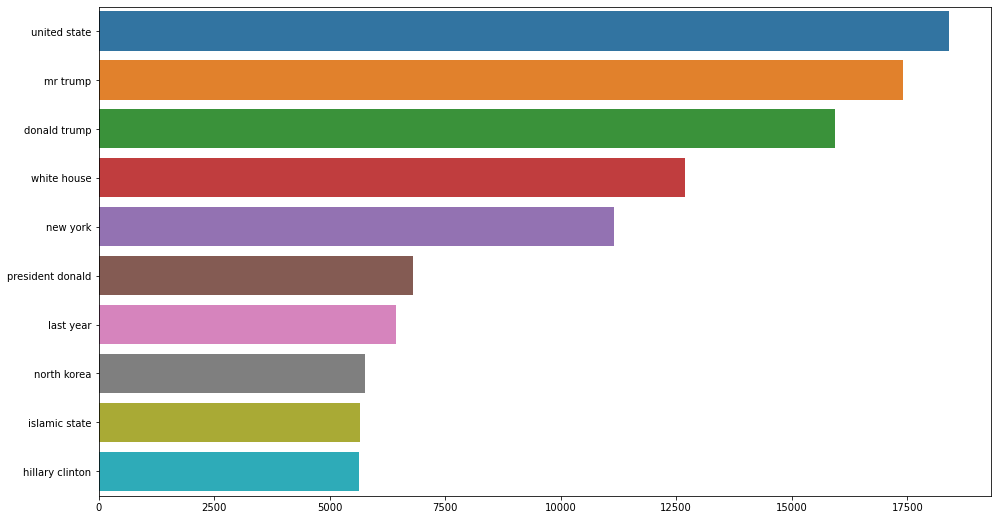

In [50]:
#Real body
plt.figure(figsize = (16,9))
most_common_bi = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 1, 'text'],10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))

<AxesSubplot:>

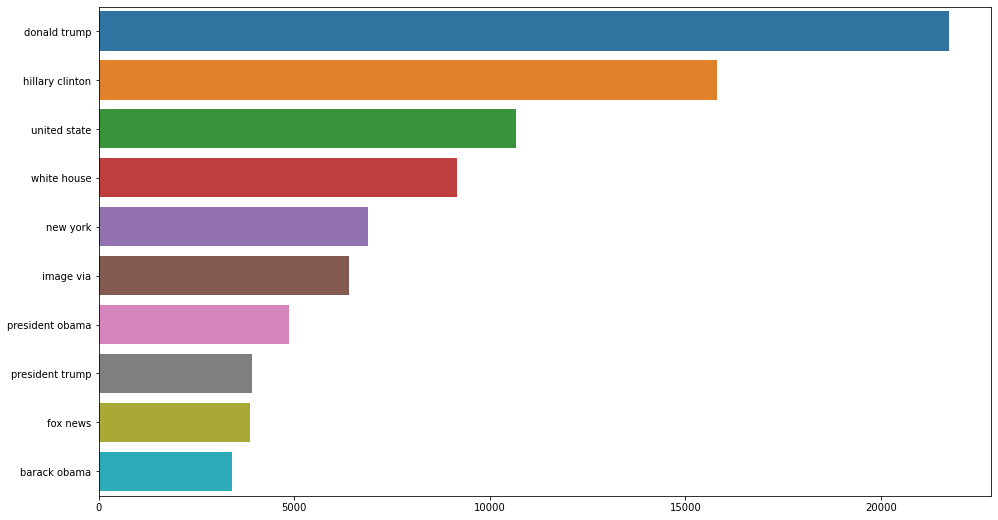

In [51]:
#Fake body
plt.figure(figsize = (16,9))
most_common_bi = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 0, 'text'],10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))

<AxesSubplot:>

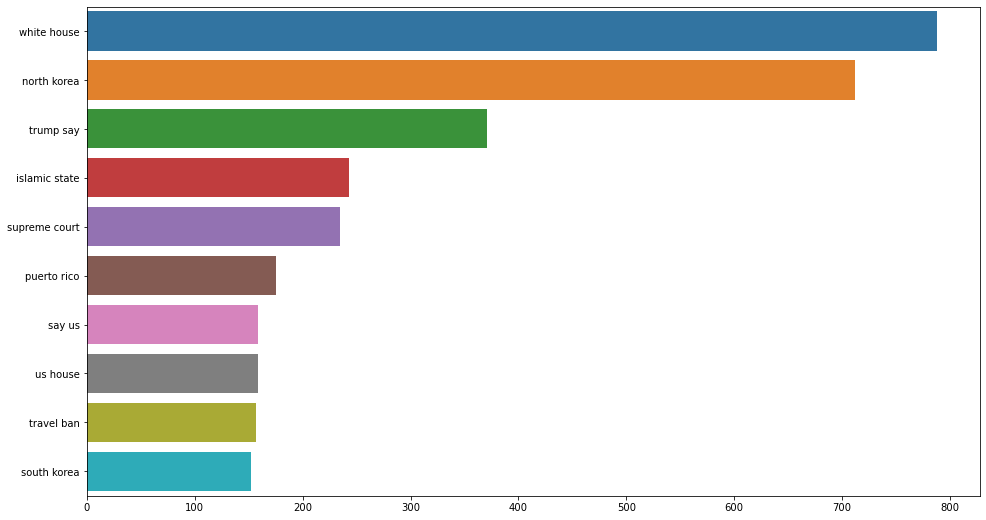

In [52]:
#Real Headline
plt.figure(figsize = (16,9))
most_common_bi = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 1, 'title'],10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))

<AxesSubplot:>

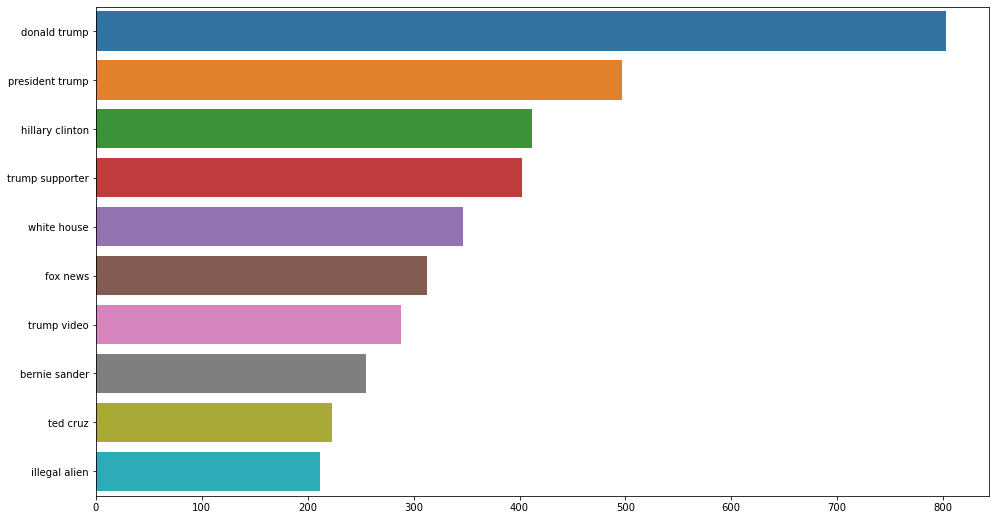

In [53]:
#Fake Headline
plt.figure(figsize = (16,9))
most_common_bi = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 0, 'title'],10,2)
most_common_bi = dict(most_common_bi)
sns.barplot(x=list(most_common_bi.values()),y=list(most_common_bi.keys()))

### Trigram Analysis

<AxesSubplot:>

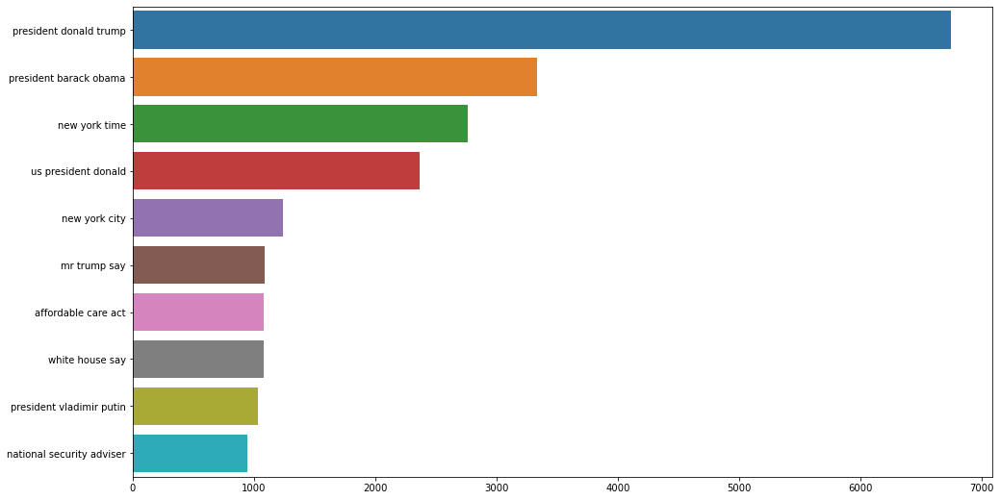

In [58]:
#Real body
plt.figure(figsize = (16,9))
most_common_tri = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 1, 'text'],10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))

<AxesSubplot:>

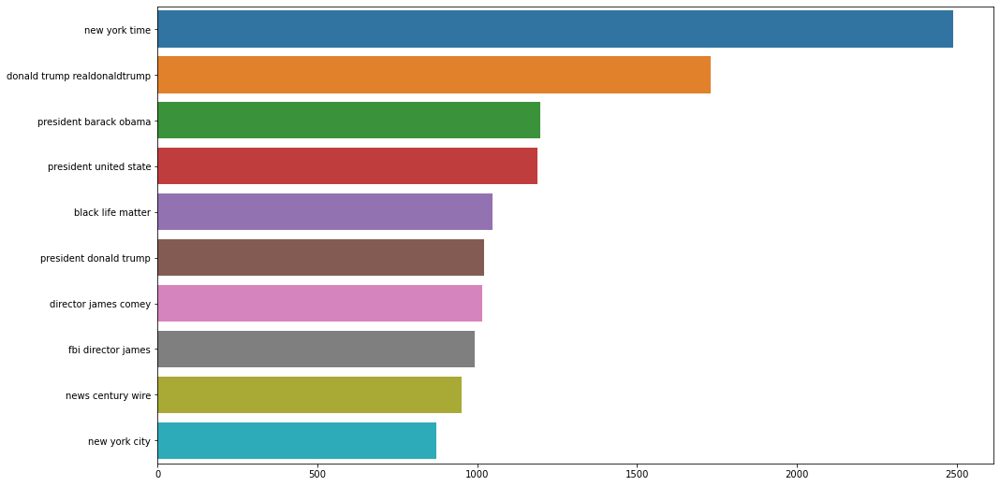

In [55]:
#Fake body
plt.figure(figsize = (16,9))
most_common_tri = get_top_text_ngrams(mergedData.loc[mergedData['label'] == 0, 'text'],10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))

<AxesSubplot:>

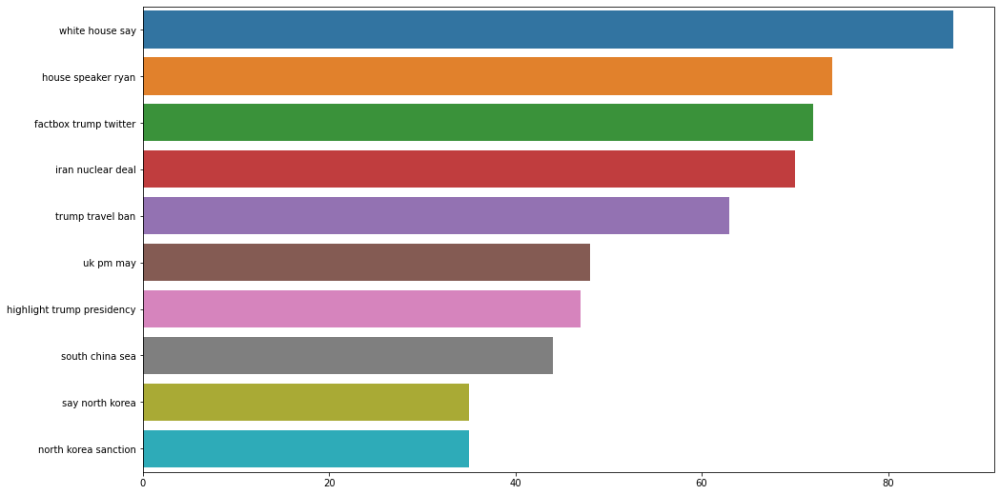

In [56]:
#Real Headline
plt.figure(figsize = (16,9))
most_common_tri = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 1, 'title'],10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))

<AxesSubplot:>

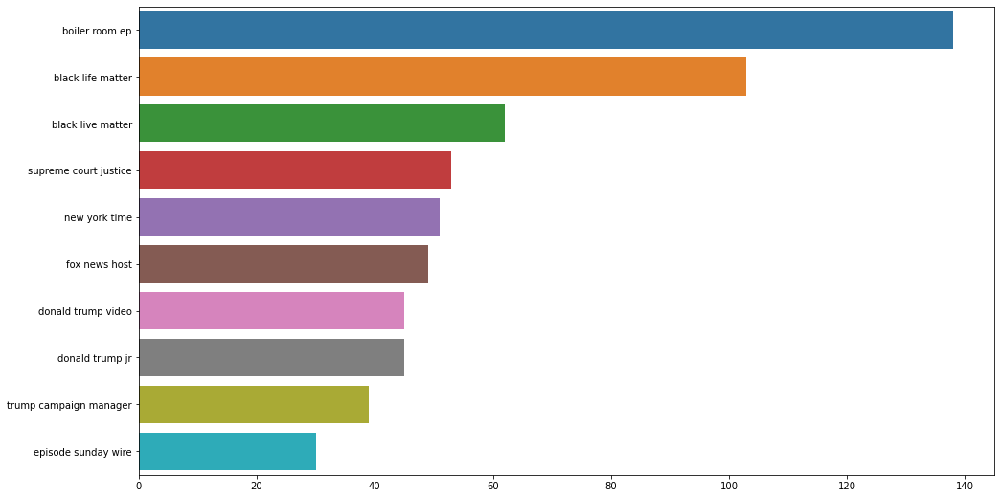

In [57]:
#Fake Headline
plt.figure(figsize = (16,9))
most_common_tri = get_top_text_ngrams(mergedHL.loc[mergedHL['label'] == 0, 'title'],10,3)
most_common_tri = dict(most_common_tri)
sns.barplot(x=list(most_common_tri.values()),y=list(most_common_tri.keys()))

### Sentiment Analysis

In [59]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

def get_vader_score(sent):
    # Polarity score returns dictionary
    ss = sid.polarity_scores(sent)
    #return ss
    return ss

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\qiron\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [60]:
#News body text
# Create new columns to store the sentiment scores 
mergedData['negative'] = None
mergedData['neutral'] = None
mergedData['positive'] = None
mergedData['compound'] = None

# Loop through the rows in the DataFrame and calculate the sentiment scores
for index, row in mergedData.iterrows():
    sentiment_scores = get_vader_score(row['text'])
    # Extract negative, neutral, and positive scores from the sentiment score dictionary
    negative_score = sentiment_scores['neg']
    neutral_score = sentiment_scores['neu']
    positive_score = sentiment_scores['pos']
    compound_score = sentiment_scores['compound']
    # Set the values of the new columns for this row to the respective scores
    mergedData.at[index, 'negative'] = negative_score
    mergedData.at[index, 'neutral'] = neutral_score
    mergedData.at[index, 'positive'] = positive_score
    mergedData.at[index, 'compound'] = compound_score


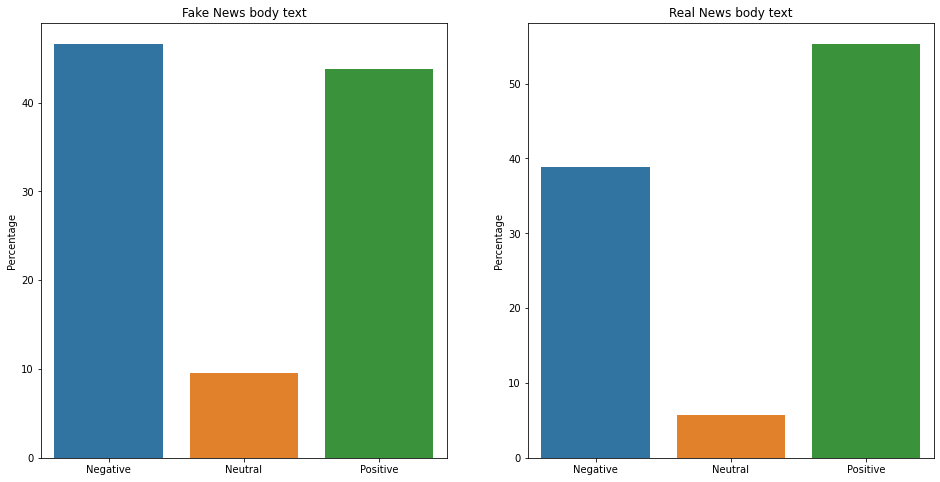

In [61]:
mergedData['com_score'] = 0
mergedData.loc[mergedData['compound'] > 0.2, 'com_score'] = 1
mergedData.loc[mergedData['compound'] < -0.2, 'com_score'] = -1

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 8))

# filter the dataframe based on label
mergedData_0 = mergedData[mergedData['label'] == 0]
mergedData_1 = mergedData[mergedData['label'] == 1]

# create bar plot for label 0
counts_0 = mergedData_0.com_score.value_counts(normalize=True) * 100
sns.barplot(x=counts_0.index, y=counts_0, ax=ax1)
ax1.set_title("Fake News body text")
ax1.set_xticklabels(['Negative', 'Neutral', 'Positive'])
ax1.set_ylabel("Percentage")

# create bar plot for label 1
counts_1 = mergedData_1.com_score.value_counts(normalize=True) * 100
sns.barplot(x=counts_1.index, y=counts_1, ax=ax2)
ax2.set_title("Real News body text")
ax2.set_xticklabels(['Negative', 'Neutral', 'Positive'])
ax2.set_ylabel("Percentage")

plt.show()

In [62]:
#News Headline
# Create new columns to store the sentiment scores 
mergedHL['negative'] = None
mergedHL['neutral'] = None
mergedHL['positive'] = None
mergedHL['compound'] = None

# Loop through the rows in the DataFrame and calculate the sentiment scores
for index, row in mergedHL.iterrows():
    sentiment_scores = get_vader_score(row['title'])
    # Extract negative, neutral, and positive scores from the sentiment score dictionary
    negative_score = sentiment_scores['neg']
    neutral_score = sentiment_scores['neu']
    positive_score = sentiment_scores['pos']
    compound_score = sentiment_scores['compound']
    # Set the values of the new columns for this row to the respective scores
    mergedHL.at[index, 'negative'] = negative_score
    mergedHL.at[index, 'neutral'] = neutral_score
    mergedHL.at[index, 'positive'] = positive_score
    mergedHL.at[index, 'compound'] = compound_score

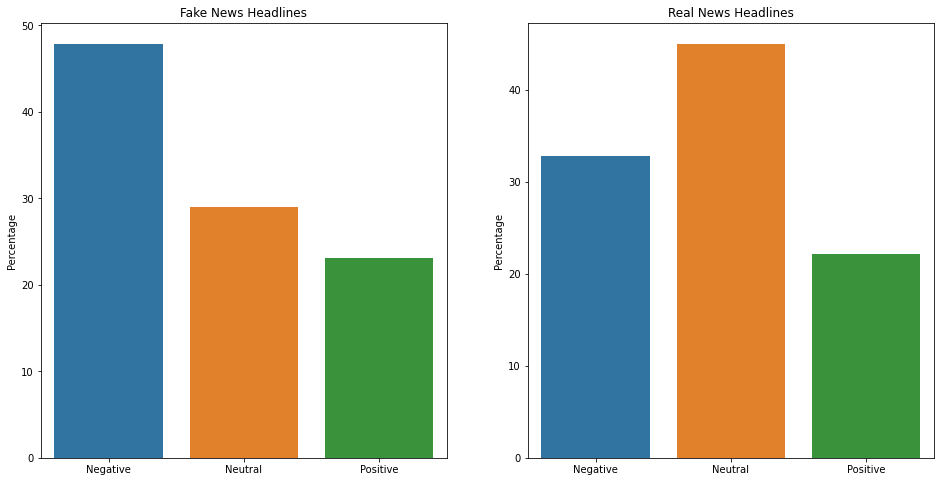

In [63]:
mergedHL['com_score'] = 0
mergedHL.loc[mergedHL['compound'] > 0.2, 'com_score'] = 1
mergedHL.loc[mergedHL['compound'] < -0.2, 'com_score'] = -1

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 8))

# filter the dataframe based on label
mergedHL_0 = mergedHL[mergedHL['label'] == 0]
mergedHL_1 = mergedHL[mergedHL['label'] == 1]

# create bar plot for label 0
counts_0 = mergedHL_0.com_score.value_counts(normalize=True) * 100
sns.barplot(x=counts_0.index, y=counts_0, ax=ax1)
ax1.set_title("Fake News Headlines")
ax1.set_xticklabels(['Negative', 'Neutral', 'Positive'])
ax1.set_ylabel("Percentage")

# create bar plot for label 1
counts_1 = mergedHL_1.com_score.value_counts(normalize=True) * 100
sns.barplot(x=counts_1.index, y=counts_1, ax=ax2)
ax2.set_title("Real News Headlines")
ax2.set_xticklabels(['Negative', 'Neutral', 'Positive'])
ax2.set_ylabel("Percentage")

plt.show()

## Vectorization
Transform our text to numerical so that our ML model can understand it and can work with it.

In [64]:
from sklearn.feature_extraction.text import TfidfVectorizer
x = mergedData.text.values
y = mergedData.label.values
a = mergedHL.title.values
b = mergedHL.label.values

vectorization1 = TfidfVectorizer()
vectorization2 = TfidfVectorizer()
x = vectorization1.fit_transform(x)
a = vectorization2.fit_transform(a)

In [65]:
#Accessing the feature vectors of the first 50 documents/articles
feature_vectors = x[:50].toarray()
feature_HL_vectors = a[:50].toarray()
feature_names = vectorization1.get_feature_names()
feature_HL_names = vectorization2.get_feature_names()

#Converting array into a table
df = pd.DataFrame(feature_vectors, columns=feature_names)
HLdf = pd.DataFrame(feature_HL_vectors, columns=feature_HL_names)

#Filter out columns with all zeros
df = df.loc[:, (df != 0).any(axis=0)]
HLdf = df.loc[:, (df != 0).any(axis=0)]

#Filter out rows with all zeros
df = df.loc[(df!=0).any(axis=1)]
HLdf = HLdf.loc[(df!=0).any(axis=1)]

print(df.head())
print(HLdf.head())

   aamer  abandon  ability  abkhazia      able  aboard  abortion  aboutface  \
0    0.0      0.0      0.0       0.0  0.030321     0.0       0.0        0.0   
1    0.0      0.0      0.0       0.0  0.000000     0.0       0.0        0.0   
2    0.0      0.0      0.0       0.0  0.000000     0.0       0.0        0.0   
3    0.0      0.0      0.0       0.0  0.000000     0.0       0.0        0.0   
4    0.0      0.0      0.0       0.0  0.000000     0.0       0.0        0.0   

   abrupt  absolve  ...  штабов  экземпляре  экспедиционная  \
0     0.0      0.0  ...     0.0         0.0             0.0   
1     0.0      0.0  ...     0.0         0.0             0.0   
2     0.0      0.0  ...     0.0         0.0             0.0   
3     0.0      0.0  ...     0.0         0.0             0.0   
4     0.0      0.0  ...     0.0         0.0             0.0   

   экспериментального  эриком  эскадренного  эсминец  эсминцев  этого  этой  
0                 0.0     0.0           0.0      0.0       0.0    0.

Each row of the table represents a text article and each column represents a word. Each word is assigned a TF-IDF weight. E.g, how frequent the word occurs and how infrequent it occurs

In [66]:
#Train-test-split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2)
a_train, a_test, b_train, b_test = train_test_split(a, b, test_size = 0.2)

## Logistic Regression

In [67]:
from sklearn.linear_model import LogisticRegression
LR1 = LogisticRegression()
LR2 = LogisticRegression()
LR1.fit(x_train,y_train)
LR2.fit(a_train,b_train)

LogisticRegression()

In [68]:
#Train set
x_train_prediction = LR1.predict(x_train)
a_train_prediction = LR2.predict(a_train)
training_accuracy = accuracy_score(x_train_prediction, y_train)
training_accuracy_HL = accuracy_score(a_train_prediction, b_train)
print(training_accuracy)
print(training_accuracy_HL)

0.9536981072053443
0.960734659802421


In [69]:
#Test set
x_test_prediction = LR1.predict(x_test)
a_test_prediction = LR2.predict(a_test)
testing_accuracy = accuracy_score(x_test_prediction, y_test)
testing_accuracy_HL = accuracy_score(a_test_prediction, b_test)
print(testing_accuracy)
print(testing_accuracy_HL)

0.9330703651864105
0.9425645592163847


              precision    recall  f1-score   support

           0       0.93      0.95      0.94      8821
           1       0.94      0.91      0.92      6897

    accuracy                           0.93     15718
   macro avg       0.93      0.93      0.93     15718
weighted avg       0.93      0.93      0.93     15718



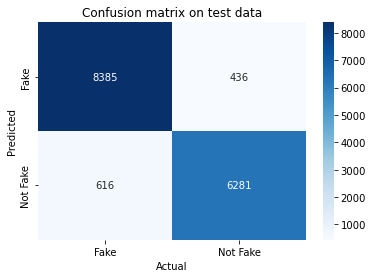

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      4736
           1       0.93      0.95      0.94      4248

    accuracy                           0.94      8984
   macro avg       0.94      0.94      0.94      8984
weighted avg       0.94      0.94      0.94      8984



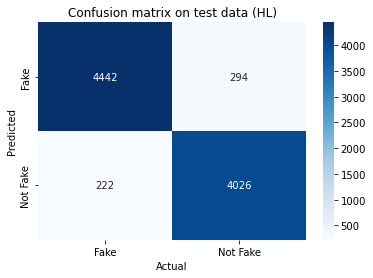

In [70]:
print(classification_report(y_test, x_test_prediction))
cm = pd.DataFrame(confusion_matrix(y_test,x_test_prediction) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on test data')
plt.show()

print(classification_report(b_test, a_test_prediction))
cm = pd.DataFrame(confusion_matrix(b_test,a_test_prediction) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on test data (HL)')
plt.show()

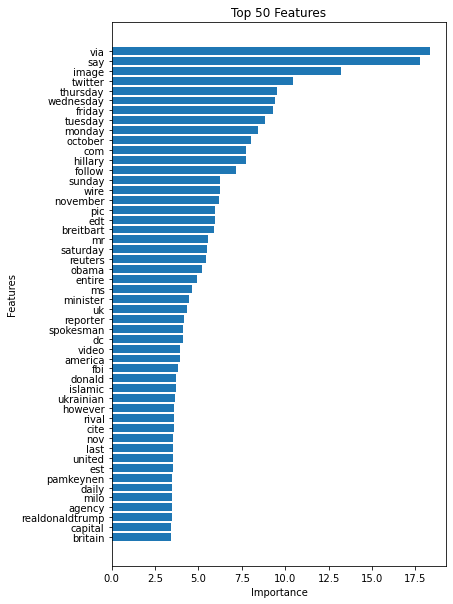

In [71]:
#Extract the absolute values of the coefficients of the logistic regression model (LR) and stores them in the list coef.
coef = [abs(i) for i in LR1.coef_.ravel()]

#This line gets the feature names used in the vectorization process
feature_names = vectorization1.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,coef))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

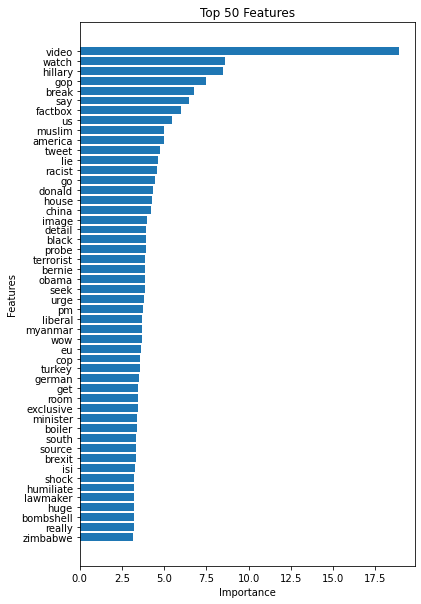

In [72]:
#Extract the absolute values of the coefficients of the logistic regression model (LR) and stores them in the list coef.
coef = [abs(i) for i in LR2.coef_.ravel()]

#This line gets the feature names used in the vectorization process
feature_names = vectorization2.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,coef))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

## Random Forest Classifier


In [78]:
from sklearn.ensemble import RandomForestClassifier

RFC1 = RandomForestClassifier(n_estimators=500,random_state=0, oob_score=True)
RFC2 = RandomForestClassifier(n_estimators=500,random_state=0, oob_score=True)
RFC1.fit(x_train, y_train)
RFC2.fit(a_train, b_train)

RandomForestClassifier(n_estimators=500, oob_score=True, random_state=0)

In [79]:
RFC_pred1 = RFC1.predict(x_test)
RFC_pred2 = RFC2.predict(a_test)

In [82]:
RFC1.score(x_test, y_test)

0.9326886372311999

In [83]:
RFC2.score(a_test,b_test)

0.9424532502226179

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      8821
           1       0.94      0.91      0.92      6897

    accuracy                           0.93     15718
   macro avg       0.93      0.93      0.93     15718
weighted avg       0.93      0.93      0.93     15718



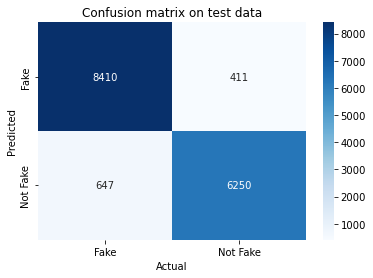

              precision    recall  f1-score   support

           0       0.95      0.94      0.95      4736
           1       0.94      0.94      0.94      4248

    accuracy                           0.94      8984
   macro avg       0.94      0.94      0.94      8984
weighted avg       0.94      0.94      0.94      8984



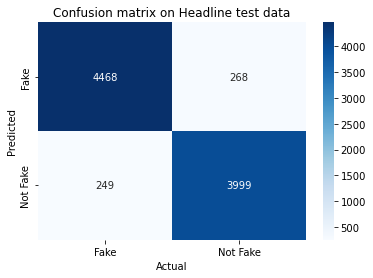

In [84]:
print(classification_report(y_test, RFC_pred1))
cm = pd.DataFrame(confusion_matrix(y_test,RFC_pred1) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on test data')
plt.show()

print(classification_report(b_test, RFC_pred2))
cm = pd.DataFrame(confusion_matrix(b_test,RFC_pred2) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on Headline test data')
plt.show()

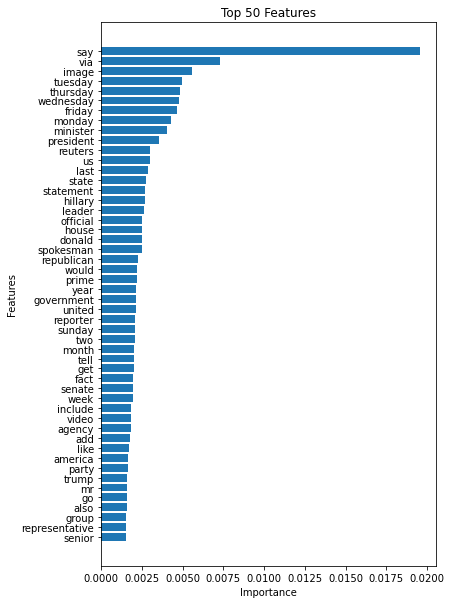

In [85]:
#Extract the absolute values of the coefficients of the Random Forest model (LR) and stores them in the list coef.
importances = [abs(i) for i in RFC1.feature_importances_]

#This line gets the feature names used in the vectorization process
feature_names = vectorization1.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,importances))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

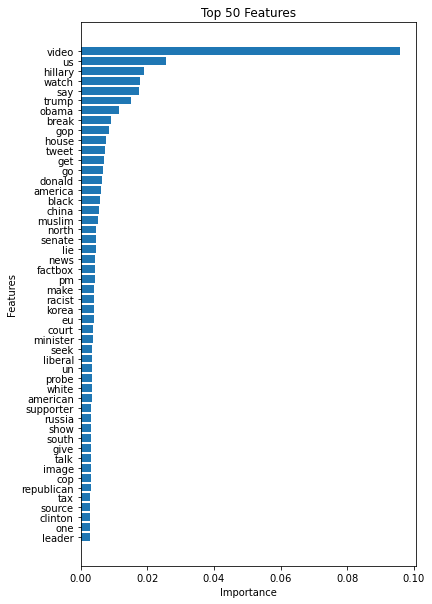

In [86]:
#Extract the absolute values of the coefficients of the Random Forest model (LR) and stores them in the list coef.
importances = [abs(i) for i in RFC2.feature_importances_]

#This line gets the feature names used in the vectorization process
feature_names = vectorization2.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,importances))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

## XGBoost

In [87]:
#import XGBoost
#import sys
#!{sys.executable} -m pip install xgboost 
import xgboost
from xgboost import XGBClassifier
# Train the XGBoost model
xgb1 = XGBClassifier()
xgb2 = XGBClassifier()
xgb1.fit(x_train, y_train)
xgb2.fit(a_train, b_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [88]:
# Predict on the test set
y_pred1 = xgb1.predict(x_test)
y_pred2 = xgb2.predict(a_test)

In [89]:
# Evaluate the performance of the model
accuracy1 = accuracy_score(y_pred1, y_test)
accuracy2 = accuracy_score(y_pred2, b_test)
print('Accuracy:', accuracy1)
print('Accuracy_HL:', accuracy2)

Accuracy: 0.941850108156254
Accuracy_HL: 0.9071682991985752


              precision    recall  f1-score   support

           0       0.94      0.95      0.95      8821
           1       0.94      0.93      0.93      6897

    accuracy                           0.94     15718
   macro avg       0.94      0.94      0.94     15718
weighted avg       0.94      0.94      0.94     15718



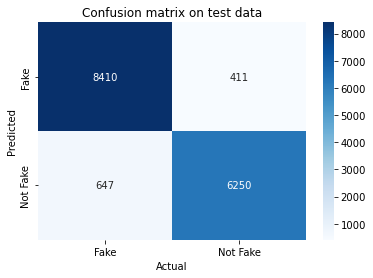

              precision    recall  f1-score   support

           0       0.95      0.87      0.91      4736
           1       0.87      0.94      0.91      4248

    accuracy                           0.91      8984
   macro avg       0.91      0.91      0.91      8984
weighted avg       0.91      0.91      0.91      8984



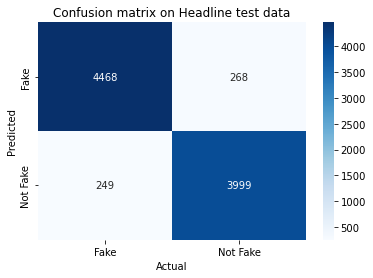

In [92]:
print(classification_report(y_test, y_pred1))
cm = pd.DataFrame(confusion_matrix(y_test,RFC_pred1) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on test data')
plt.show()

print(classification_report(b_test, y_pred2))
cm = pd.DataFrame(confusion_matrix(b_test,RFC_pred2) , index = ['Fake','Not Fake'] , columns = ['Fake','Not Fake'])
sns.heatmap(cm,cmap= 'Blues', annot = True, fmt='', xticklabels = ['Fake','Not Fake'], yticklabels = ['Fake','Not Fake'])
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title('Confusion matrix on Headline test data')
plt.show()

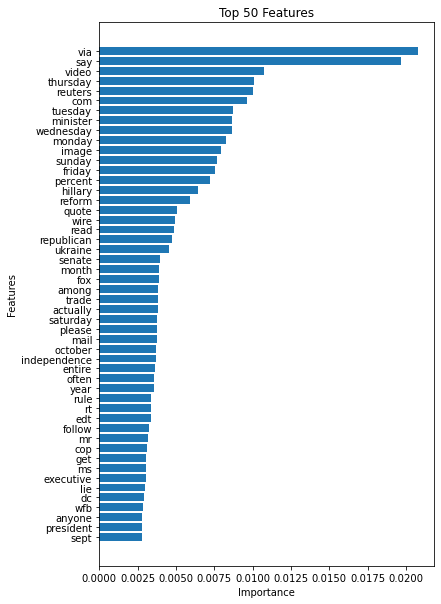

In [90]:
#Extract the absolute values of the coefficients of the XGB and stores them in the list coef.
importances = [abs(i) for i in xgb1.feature_importances_]

#This line gets the feature names used in the vectorization process
feature_names = vectorization1.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,importances))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

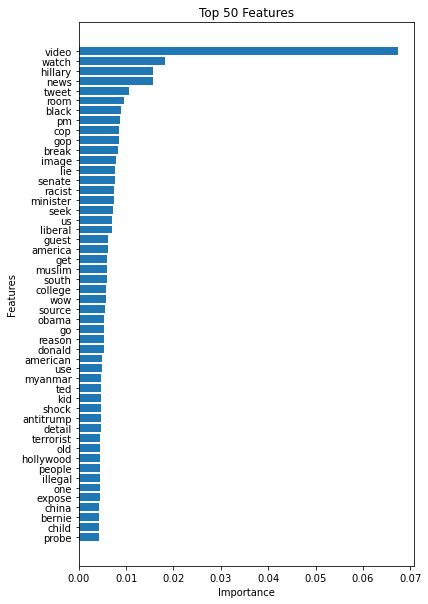

In [91]:
#Extract the absolute values of the coefficients of the XGB and stores them in the list coef.
importances = [abs(i) for i in xgb2.feature_importances_]

#This line gets the feature names used in the vectorization process
feature_names = vectorization2.get_feature_names()

#Creates a dictionary feature_imp that maps the feature names to their corresponding absolute coefficient values.
feature_imp = dict(zip(feature_names,importances))

#Sort the dictionary feature_imp by the values in descending order to get the most important features at the top.
feature_imp = {k: v for k, v in sorted(feature_imp.items(), key=lambda item: item[1], reverse=True)}

#Select the top 50 features with the highest coefficient values and stores them in the dictionary top_50_features.
top_50_features = {k: feature_imp[k] for k in list(feature_imp)[0:50]}

fig, ax = plt.subplots(figsize=(6,10))

people = top_50_features.keys()
y_pos = np.arange(len(people))
importance = top_50_features.values()

ax.barh(y_pos, importance,align='center')
ax.set_yticks(y_pos)
ax.set_yticklabels(people)
ax.invert_yaxis()
ax.set_xlabel('Importance')
ax.set_ylabel('Features')
ax.set_title('Top 50 Features')

plt.show()

## Building a system to test for fake news

In [95]:
def output(n):
    if n == 0:
        return "Fake News"
    elif n == 1:
        return "Not A Fake News"
    
def testing1(news):
    pred_LR = LR1.predict(news)
    pred_RFC = RFC1.predict(news)
    pred_XGB = xgb1.predict(news)
    return print("\nLR Prediction: {} \nRFC Prediction: {} \nXGB Prediction: {} ".format(output(pred_LR),output(pred_RFC),output(pred_XGB)))

In [96]:
def output(n):
    if n == 0:
        return "Fake News"
    elif n == 1:
        return "Not A Fake News"
    
def testing2(news):
    pred_LR = LR2.predict(news)
    pred_RFC = RFC2.predict(news)
    pred_XGB = xgb2.predict(news)
    
    return print("\nLR Prediction: {} \nRFC Prediction: {} \nXGB Prediction: {} ".format(output(pred_LR),output(pred_RFC),output(pred_XGB)))

In [98]:
#For body text
for i in range(0,6):
    testing1(x_test[i])


LR Prediction: Not A Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 

LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 

LR Prediction: Not A Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 

LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 

LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 

LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 


In [99]:
#For headline
for i in range(0,6):
    testing2(a_test[i])


LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 

LR Prediction: Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 

LR Prediction: Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 

LR Prediction: Fake News 
RFC Prediction: Fake News 
XGB Prediction: Fake News 

LR Prediction: Not A Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 

LR Prediction: Not A Fake News 
RFC Prediction: Not A Fake News 
XGB Prediction: Not A Fake News 
